<a href="https://colab.research.google.com/github/claudio1975/Climate_Risk_Modelling_with_LLMs/blob/main/single_step/Flood_pred_whole_damage_work_single_step_aug_v_2_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Prepare Workspace

In [1]:
! pip install shap &> /dev/null

In [2]:
! pip install optuna &> /dev/null

In [3]:
# utils packages
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import seaborn as sns
import datetime
import scipy
import scipy.stats as stats
import statsmodels
import sklearn
import lightgbm
from pandas.plotting import autocorrelation_plot
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from math import radians, sin, cos, sqrt, atan2
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import randint
import optuna


# packages for prediction and other utils functions
from sklearn.linear_model import TweedieRegressor
from sklearn.ensemble import IsolationForest
from lightgbm import LGBMRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, TimeSeriesSplit
from sklearn.preprocessing import MinMaxScaler

# to evaluate models
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_poisson_deviance
from sklearn.metrics import mean_gamma_deviance
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import make_scorer
import shap

import warnings
warnings.simplefilter(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

In [4]:
np.__version__

'1.25.2'

In [5]:
pd.__version__

'2.0.3'

In [6]:
matplotlib.__version__

'3.7.1'

In [7]:
sns.__version__

'0.13.1'

In [8]:
scipy.__version__

'1.11.4'

In [9]:
statsmodels.__version__

'0.14.2'

In [10]:
sklearn.__version__

'1.2.2'

In [11]:
optuna.__version__

'3.6.1'

In [12]:
shap.__version__

'0.45.1'

In [13]:
lightgbm.__version__

'4.1.0'

### Upload data set

In [14]:
df=pd.read_csv('./flood_dataset_fe4.csv',index_col=0)

### Handling Date Time format

In [15]:
# Trasform BEGIN_DATE_TIME and END_DATE_TIME in datetime format
df["BEGIN_DATE_TIME"] = pd.to_datetime(df["BEGIN_DATE_TIME"], format="%d-%b-%y %H:%M:%S")
df["END_DATE_TIME"] = pd.to_datetime(df["END_DATE_TIME"], format="%d-%b-%y %H:%M:%S")

In [16]:
# Create index
df.index = pd.to_datetime(df.BEGIN_DATE_TIME)
df.index.names = ['Date']
# Sort DataFrame by date column in descending order
df.sort_values(by='Date', ascending = True, inplace = True)
# Sanity check: data span.
df.index.min(), df.index.max()

(Timestamp('2006-10-02 14:00:00'), Timestamp('2022-12-31 23:00:00'))

### Have a brief look of the data set

In [17]:
df.shape

(38398, 53)

In [18]:
df.columns

Index(['EVENT_ID', 'BEGIN_DATE_TIME', 'END_DATE_TIME', 'STATE', 'STATE_FIPS',
       'EVENT_TYPE', 'CZ_TYPE', 'CZ_FIPS', 'CZ_NAME', 'WFO', 'CZ_TIMEZONE',
       'INJURIES_DIRECT', 'INJURIES_INDIRECT', 'DEATHS_DIRECT',
       'DEATHS_INDIRECT', 'DAMAGE_PROPERTY', 'DAMAGE_CROPS', 'SOURCE',
       'FLOOD_CAUSE', 'BEGIN_RANGE', 'BEGIN_AZIMUTH', 'BEGIN_LOCATION',
       'END_RANGE', 'END_AZIMUTH', 'END_LOCATION', 'BEGIN_LAT', 'BEGIN_LON',
       'END_LAT', 'END_LON', 'EPISODE_NARRATIVE', 'EVENT_NARRATIVE',
       'predicted_sentiment_gpt', 'embed_episod_gpt0', 'embed_episod_gpt1',
       'embed_episod_gpt2', 'embed_episod_gpt3', 'embed_episod_gpt4',
       'embed_episod_gpt5', 'embed_episod_gpt6', 'embed_episod_gpt7',
       'embed_episod_gpt8', 'embed_episod_gpt9', 'embed_event_gpt0',
       'embed_event_gpt1', 'embed_event_gpt2', 'embed_event_gpt3',
       'embed_event_gpt4', 'embed_event_gpt5', 'embed_event_gpt6',
       'embed_event_gpt7', 'embed_event_gpt8', 'embed_event_gpt9',
       

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 38398 entries, 2006-10-02 14:00:00 to 2022-12-31 23:00:00
Data columns (total 53 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   EVENT_ID                 38398 non-null  int64         
 1   BEGIN_DATE_TIME          38398 non-null  datetime64[ns]
 2   END_DATE_TIME            38398 non-null  datetime64[ns]
 3   STATE                    38398 non-null  object        
 4   STATE_FIPS               38398 non-null  float64       
 5   EVENT_TYPE               38398 non-null  object        
 6   CZ_TYPE                  38398 non-null  object        
 7   CZ_FIPS                  38398 non-null  int64         
 8   CZ_NAME                  38398 non-null  object        
 9   WFO                      38398 non-null  object        
 10  CZ_TIMEZONE              38398 non-null  object        
 11  INJURIES_DIRECT          38398 non-null  int64         
 1

In [20]:
num_cols = [var for var in df.columns if df[var].dtype in ['int64','float64']]
num = df[num_cols]
num.columns

Index(['EVENT_ID', 'STATE_FIPS', 'CZ_FIPS', 'INJURIES_DIRECT',
       'INJURIES_INDIRECT', 'DEATHS_DIRECT', 'DEATHS_INDIRECT',
       'DAMAGE_PROPERTY', 'DAMAGE_CROPS', 'BEGIN_RANGE', 'END_RANGE',
       'BEGIN_LAT', 'BEGIN_LON', 'END_LAT', 'END_LON', 'embed_episod_gpt0',
       'embed_episod_gpt1', 'embed_episod_gpt2', 'embed_episod_gpt3',
       'embed_episod_gpt4', 'embed_episod_gpt5', 'embed_episod_gpt6',
       'embed_episod_gpt7', 'embed_episod_gpt8', 'embed_episod_gpt9',
       'embed_event_gpt0', 'embed_event_gpt1', 'embed_event_gpt2',
       'embed_event_gpt3', 'embed_event_gpt4', 'embed_event_gpt5',
       'embed_event_gpt6', 'embed_event_gpt7', 'embed_event_gpt8',
       'embed_event_gpt9'],
      dtype='object')

In [21]:
obj_cols = [var for var in df.columns if df[var].dtype in ['object']]
cat = df[obj_cols]
cat.columns

Index(['STATE', 'EVENT_TYPE', 'CZ_TYPE', 'CZ_NAME', 'WFO', 'CZ_TIMEZONE',
       'SOURCE', 'FLOOD_CAUSE', 'BEGIN_AZIMUTH', 'BEGIN_LOCATION',
       'END_AZIMUTH', 'END_LOCATION', 'EPISODE_NARRATIVE', 'EVENT_NARRATIVE',
       'predicted_sentiment_gpt', 'predicted_risk_gpt'],
      dtype='object')

### Build features

In [22]:
# Created year, month, day, time begin/end feature
df_1 = df.copy()
df_1['YEAR_BEGIN'] = pd.DatetimeIndex(df_1['BEGIN_DATE_TIME']).year
df_1['MONTH_BEGIN'] = pd.DatetimeIndex(df_1['BEGIN_DATE_TIME']).month
df_1['DAY_BEGIN'] = pd.DatetimeIndex(df_1['BEGIN_DATE_TIME']).day
df_1['HOUR_BEGIN'] = pd.DatetimeIndex(df_1['BEGIN_DATE_TIME']).hour
df_1['YEAR_BEGIN']= df_1["YEAR_BEGIN"].astype("int64")
df_1['MONTH_BEGIN']= df_1["MONTH_BEGIN"].astype("int64")
df_1['DAY_BEGIN']= df_1["DAY_BEGIN"].astype("int64")
df_1['HOUR_BEGIN']= df_1["HOUR_BEGIN"].astype("int64")
df_1['YEAR_END'] = pd.DatetimeIndex(df_1['END_DATE_TIME']).year
df_1['MONTH_END'] = pd.DatetimeIndex(df_1['END_DATE_TIME']).month
df_1['DAY_END'] = pd.DatetimeIndex(df_1['END_DATE_TIME']).day
df_1['HOUR_END'] = pd.DatetimeIndex(df_1['END_DATE_TIME']).hour
df_1['YEAR_END']= df_1["YEAR_END"].astype("int64")
df_1['MONTH_END']= df_1["MONTH_END"].astype("int64")
df_1['DAY_END']= df_1["DAY_END"].astype("int64")
df_1['HOUR_END']= df_1["HOUR_END"].astype("int64")

In [23]:
# Calculate the difference between dates and convert it to days and hours
df_1['DAY_DURATION'] = (df_1['END_DATE_TIME'] - df_1['BEGIN_DATE_TIME']).dt.days
df_1['HOUR_DURATION'] = (df_1['END_DATE_TIME'] - df_1['BEGIN_DATE_TIME']).dt.total_seconds() / 3600

In [24]:
# Merge Origin and Destination to have a look at the round event
df_1['LOCATION_ORIGIN_DESTINATION'] = df_1['BEGIN_LOCATION']+'-'+df_1['END_LOCATION']
df_1['BEGIN_END_AZIMUTH'] = df_1['BEGIN_AZIMUTH']+'-'+df_1['END_AZIMUTH']

In [25]:
# new target features
df_1['WHOLE_INJURIES'] = df_1['INJURIES_INDIRECT'] + df_1['INJURIES_DIRECT']
df_1['WHOLE_DEATHS'] = df_1['DEATHS_INDIRECT'] + df_1['DEATHS_DIRECT']
df_1['WHOLE_DAMAGE'] = df_1['DAMAGE_CROPS'] + df_1['DAMAGE_PROPERTY']
df_1['NBCLAIMS_TOT'] = df_1['WHOLE_INJURIES'] + df_1['WHOLE_DEATHS']
df_1['A_WHOLE_DAMAGE'] = df_1.apply(lambda row: row['WHOLE_DAMAGE'] / row['NBCLAIMS_TOT'] if row['NBCLAIMS_TOT'] > 0 else 0, axis=1)


In [26]:
# Distance of the event
def haversine_distance(row):
    # Convert latitude and longitude from degrees to radians
    lat1, lon1 = radians(row['BEGIN_LAT']), radians(row['BEGIN_LON'])
    lat2, lon2 = radians(row['END_LAT']), radians(row['END_LON'])

    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    radius_of_earth = 6371  # Earth's radius in kilometers
    distance = radius_of_earth * c

    return distance

In [27]:
# Distance
df_1['DISTANCE'] = df_1.apply(haversine_distance, axis=1)
df_1['DISTANCE_RANGE']=df_1['END_RANGE']-df_1['BEGIN_RANGE']

In [28]:
# Drop old variables replaced by new variables
df_2=df_1.copy()
df_2 = df_2.drop(['BEGIN_LOCATION','END_LOCATION','BEGIN_AZIMUTH','END_AZIMUTH',
                  'INJURIES_INDIRECT','DEATHS_INDIRECT','DAMAGE_CROPS',
                  'END_RANGE','BEGIN_RANGE','BEGIN_LAT','BEGIN_LON','END_LAT','END_LON',
                  'WHOLE_DEATHS','WHOLE_INJURIES','WHOLE_DAMAGE'], axis=1)

### Encoding

In [29]:
df_encod=df_2.copy()

In [30]:
# encod_predicted_sentiment_gpt
encod_sentiment = {'negative':'0','positive':'1','neutral':'2'}
df_encod['predicted_sentiment_gpt'] = df_encod['predicted_sentiment_gpt'].map(encod_sentiment)
df_encod['predicted_sentiment_gpt']= df_encod['predicted_sentiment_gpt'].astype(int)
# encod_predicted_risk_gpt
encod_risk = {'high risk':'0','medium risk':'1','low risk':'2'}
df_encod['predicted_risk_gpt'] = df_encod['predicted_risk_gpt'].map(encod_risk)
df_encod['predicted_risk_gpt']= df_encod['predicted_risk_gpt'].astype(int)


In [31]:
# grouping_STATE
# '0' -> 'OTHERS'
state_group = {'CALIFORNIA':'1','ILLINOIS':'2','INDIANA':'3','KENTUCKY':'4','ARKANSAS':'5','TEXAS':'6','MASSACHUSETTS':'7','MISSOURI':'8'}
df_encod['STATE'] = df_encod['STATE'].map(state_group)
df_encod['STATE'].fillna('0', inplace=True)
df_encod['STATE']= df_encod['STATE'].astype(int)


In [32]:
# grouping_CZ_NAME
# '0' -> 'OTHERS'
state_group = {'RIVERSIDE':'1','JACKSON':'2','CALLOWAY':'3','IMPERIAL':'4','LA SALLE':'5'}
df_encod['CZ_NAME'] = df_encod['CZ_NAME'].map(state_group)
df_encod['CZ_NAME'].fillna('0', inplace=True)
df_encod['CZ_NAME']= df_encod['CZ_NAME'].astype(int)


In [33]:
# grouping_WFO
# '0' -> 'OTHERS'
state_group = {'SGX':'1','PAH':'2','LZK':'3','BOX':'4','LOT':'5','IND':'6','PSR':'7','FWD':'8'}
df_encod['WFO'] = df_encod['WFO'].map(state_group)
df_encod['WFO'].fillna('0', inplace=True)
df_encod['WFO']= df_encod['WFO'].astype(int)


In [34]:
# grouping_CZ_TIMEZONE
# '0' -> 'OTHERS'
state_group = {'CST-6':'1','PST-8':'2','MST-7':'3','EST-5':'4'}
df_encod['CZ_TIMEZONE'] = df_encod['CZ_TIMEZONE'].map(state_group)
df_encod['CZ_TIMEZONE'].fillna('0', inplace=True)
df_encod['CZ_TIMEZONE']= df_encod['CZ_TIMEZONE'].astype(int)

In [35]:
# grouping_SOURCE
# '0' -> 'OTHERS'
state_group = {'Law Enforcement':'1','Newspaper':'2','Broadcast Media':'3','Emergency Manager':'4','Other Federal Agency':'5','Amateur Radio':'6','River/Stream Gage':'7','Trained Spotter':'8'}
df_encod['SOURCE'] = df_encod['SOURCE'].map(state_group)
df_encod['SOURCE'].fillna('0', inplace=True)
df_encod['SOURCE']= df_encod['SOURCE'].astype(int)

In [36]:
# grouping_FLOOD_CAUSE
# '0' -> 'OTHERS'
state_group = {'Heavy Rain':'1','Heavy Rain/Snow Melt':'2'}
df_encod['FLOOD_CAUSE'] = df_encod['FLOOD_CAUSE'].map(state_group)
df_encod['FLOOD_CAUSE'].fillna('0', inplace=True)
df_encod['FLOOD_CAUSE']= df_encod['FLOOD_CAUSE'].astype(int)

In [37]:
# grouping_BEGIN_END_AZIMUTH
# '0' -> 'OTHERS'
state_group = {'NNE-S':'1','N-N':'2','SE-NW':'3','ENE-ESE':'4','NNW-SW':'5'}
df_encod['BEGIN_END_AZIMUTH'] = df_encod['BEGIN_END_AZIMUTH'].map(state_group)
df_encod['BEGIN_END_AZIMUTH'].fillna('0', inplace=True)
df_encod['BEGIN_END_AZIMUTH']= df_encod['BEGIN_END_AZIMUTH'].astype(int)

In [38]:
# grouping_LOCATION_ORIGIN_DESTINATION
# '0' -> 'OTHERS'
state_group = {'MURRIETTA ARPT-WINCHESTER':'1','ROCKFORD-FREEMAN ARPT':'2','LAKE HOLIDAY-RANSOM':'3','DIXIELAND-DIXIELAND':'4'}
df_encod['LOCATION_ORIGIN_DESTINATION'] = df_encod['LOCATION_ORIGIN_DESTINATION'].map(state_group)
df_encod['LOCATION_ORIGIN_DESTINATION'].fillna('0', inplace=True)
df_encod['LOCATION_ORIGIN_DESTINATION']= df_encod['LOCATION_ORIGIN_DESTINATION'].astype(int)

### Remove Outliers

In [39]:
df_3=df_encod.copy()

#### Fine-Tuning Isolation Forest

In [40]:
# Create a custom scorer object
#gamma_scorer = make_scorer(mean_gamma_deviance, greater_is_better=False)

#param_grid = {
#    "contamination": [0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5],
#}

#iso_forest = IsolationForest(random_state=0)
#iso_forest_model = GridSearchCV(iso_forest, param_grid, cv=5, scoring=gamma_scorer)
#iso_forest_model.fit(df_3[['NBCLAIMS_DIRECT','A_DAMAGE_PROPERTY',
#                     'WHOLE_INJURIES','WHOLE_DEATHS','WHOLE_DAMAGE']])

#print("Best parameters:", iso_forest_model.best_params_)

#### Fit the model

In [41]:
def is_outlier(x):
    return 'yes' if x == -1 else 'no'

model = IsolationForest(contamination=0.01, random_state=0)
predictions = model.fit_predict(df_3[['NBCLAIMS_TOT','A_WHOLE_DAMAGE',
                     'INJURIES_DIRECT','DEATHS_DIRECT','DAMAGE_PROPERTY']])
outliers = np.vectorize(is_outlier)(predictions)
outliers_series = pd.DataFrame(outliers, columns=['outliers'], index=df_3.index)
df_3_ = pd.concat([df_3, outliers_series], axis=1)

In [42]:
df_3_.query('outliers=="yes"').shape

(377, 57)

In [43]:
df_4 = df_3_.query('outliers=="no"')
# remove dditional outliers from large amounts
df_4 = df_4[df_4['A_WHOLE_DAMAGE'] <=150000]

df_4.shape

(38017, 57)

In [44]:
# drop not useful features and targets not used
df_5=df_4.drop(['EVENT_ID','BEGIN_DATE_TIME','END_DATE_TIME','EPISODE_NARRATIVE',
                     'EVENT_NARRATIVE','EVENT_TYPE','CZ_TYPE','outliers',
                     'INJURIES_DIRECT','DEATHS_DIRECT','DAMAGE_PROPERTY'], axis=1)


In [45]:
target = df_5[['A_WHOLE_DAMAGE']]
X_all = df_5.drop(['A_WHOLE_DAMAGE'], axis=1)
X_all.shape

(38017, 45)

### Zero Variance Predictors

In [46]:
# Find features with variance equal zero or lower than 0.05
to_drop = [col for col in X_all.columns if np.var(X_all[col]) ==0]
to_drop

[]

In [47]:
# Drop features
X_all_v = X_all.drop(X_all[to_drop], axis=1)

### Correlated Predictors

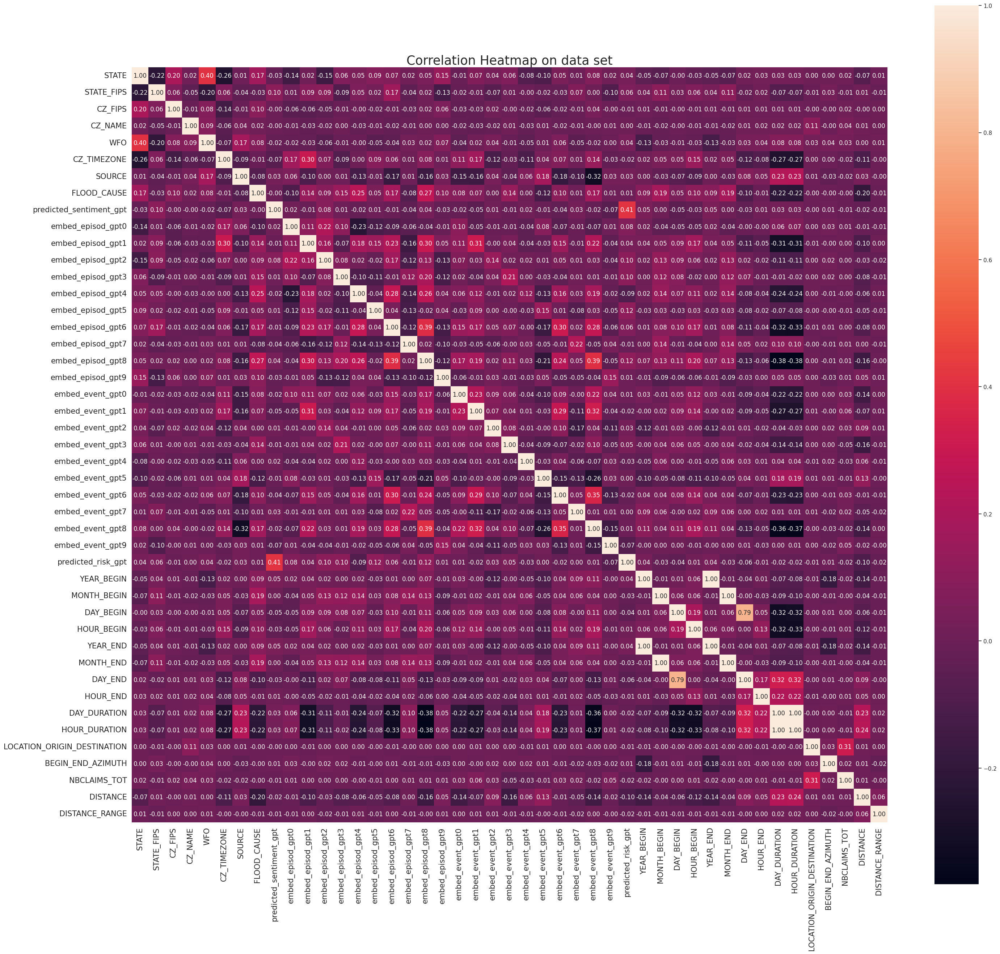

In [48]:
# Correlation heatmap
corr_matrix = X_all.corr()
sns.set( rc = {'figure.figsize': (30, 30)})
plt.figure()
sns.heatmap(corr_matrix, square = True, annot=True, fmt='.2f')
plt.title('Correlation Heatmap on data set',size=25)
plt.yticks(fontsize="15")
plt.xticks(fontsize="15")
plt.show()

In [49]:
# Select correlated features and removed it
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
# Find index of feature columns with correlation greater than 0.75
to_drop = [column for column in upper.columns if any(upper[column].abs() > 0.75)]
to_drop

['YEAR_END', 'MONTH_END', 'DAY_END', 'HOUR_DURATION']

In [50]:
# Drop features
X_all_f = X_all.drop(X_all[to_drop], axis=1)

In [51]:
# Look at the new features data set
X_all_f.shape

(38017, 41)

### Standardization

In [52]:
scaling=MinMaxScaler()

In [53]:
num1_ = ['STATE_FIPS',
'CZ_FIPS',
'YEAR_BEGIN',
'MONTH_BEGIN',
'DAY_BEGIN',
'HOUR_BEGIN',
'HOUR_END',
'DAY_DURATION',
'DISTANCE',
'DISTANCE_RANGE',
'NBCLAIMS_TOT']

In [54]:
num2_=['embed_episod_gpt0',
'embed_episod_gpt1',
'embed_episod_gpt2',
'embed_episod_gpt3',
'embed_episod_gpt4',
'embed_episod_gpt5',
'embed_episod_gpt6',
'embed_episod_gpt7',
'embed_episod_gpt8',
'embed_episod_gpt9',
'embed_event_gpt0',
'embed_event_gpt1',
'embed_event_gpt2',
'embed_event_gpt3',
'embed_event_gpt4',
'embed_event_gpt5',
'embed_event_gpt6',
'embed_event_gpt7',
'embed_event_gpt8',
'embed_event_gpt9']

In [55]:
cat_=['STATE',
'CZ_NAME',
'WFO',
'CZ_TIMEZONE',
'SOURCE',
'FLOOD_CAUSE',
'BEGIN_END_AZIMUTH',
'LOCATION_ORIGIN_DESTINATION',
'predicted_sentiment_gpt',
'predicted_risk_gpt']

In [56]:
cat_new=X_all_f[cat_]
num1_new=X_all_f[num1_]
num2_new=X_all_f[num2_]

In [57]:
# Features to scale
num_sc=pd.DataFrame(scaling.fit_transform(num1_new),
columns = ['STATE_FIPS',
'CZ_FIPS',
'YEAR_BEGIN',
'MONTH_BEGIN',
'DAY_BEGIN',
'HOUR_BEGIN',
'HOUR_END',
'DAY_DURATION',
'DISTANCE',
'DISTANCE_RANGE',
'NBCLAIMS_TOT'], index=cat_new.index)

In [58]:
# New features scaled data set
X_all_sc = pd.concat([cat_new, num_sc, num2_new],axis='columns')

### Feature Engineering with Lag and Rolling Window Features

In [59]:
# Lag Features function
def lag_feat(df, var):
  df_lag = df.copy()  # Create a copy of the original dataframe
  lags = [1,7,30,90, 180, 270, 365]  # 1 day, 7 days, 1 month, 3 months, 6 months, 9 months, 1 year
  outcomes = [var]
  df_lag=df_lag.assign(**{
      f'{col} (t-{lag})': df_lag[col].shift(lag)
      for lag in lags
      for col in outcomes})
  # Remove nan values
  df_lag = df_lag.dropna()
  return df_lag

In [60]:
# Rolling features function
def win_feat(df_lag, var):
  windows = [7, 30]  # 7 days, 1 month
  outcomes = [var]
  df_lag_win = df_lag.copy()
  for window in windows:
    for col in outcomes:
        df_lag_win[f"{col} (r_w-{window}) mean"] = df_lag_win[col].rolling(window=window).mean()
  # Remove nan values
  df_lag_win = df_lag_win.dropna()
  return df_lag_win


In [61]:
all = pd.concat([target, X_all_f], axis=1)
all_sc = pd.concat([target, X_all_sc], axis=1)


In [62]:
all_lag=lag_feat(all, 'A_WHOLE_DAMAGE')
all_lag_win=win_feat(all_lag, 'A_WHOLE_DAMAGE')
all_lag_sc=lag_feat(all_sc, 'A_WHOLE_DAMAGE')
all_lag_win_sc=win_feat(all_lag_sc, 'A_WHOLE_DAMAGE')

### Split data set

In [63]:
# Attach Target variable
# Split data set train/test set : test set is built on the last year
train = all_lag_win[all_lag_win.index < '2022-01-01']
test = all_lag_win[all_lag_win.index >= '2022-01-01']
len(train), len(test)

(35730, 1893)

In [64]:
# Attach Target variable
# Split data set train/test set : test set is built on the last year
train_sc = all_lag_win_sc[all_lag_win_sc.index < '2022-01-01']
test_sc = all_lag_win_sc[all_lag_win_sc.index >= '2022-01-01']
len(train_sc), len(test_sc)

(35730, 1893)

In [65]:
# split target and features
X_train = train.copy()
y_train = X_train.A_WHOLE_DAMAGE
train_weights=X_train.NBCLAIMS_TOT
y_train = pd.DataFrame(X_train, columns=['A_WHOLE_DAMAGE'])
X_train.drop(['A_WHOLE_DAMAGE','NBCLAIMS_TOT'], axis=1, inplace=True)
X_test = test.copy()
y_test = X_test.A_WHOLE_DAMAGE
test_weights=X_test.NBCLAIMS_TOT
y_test = pd.DataFrame(X_test, columns=['A_WHOLE_DAMAGE'])
X_test.drop(['A_WHOLE_DAMAGE','NBCLAIMS_TOT'], axis=1, inplace=True)
X_train_sc = train_sc.copy()
train_weights_sc=X_train_sc.NBCLAIMS_TOT
X_train_sc.drop(['A_WHOLE_DAMAGE','NBCLAIMS_TOT'], axis=1, inplace=True)
X_test_sc = test_sc.copy()
test_weights_sc=X_test_sc.NBCLAIMS_TOT
X_test_sc.drop(['A_WHOLE_DAMAGE','NBCLAIMS_TOT'], axis=1, inplace=True)
train_df = train.copy()
test_df = test.copy()




### Modelling & Evaluation

### Naive

### Fit & Prediction

In [66]:
y_train_=y_train.copy()
y_test_=y_test.copy()
y_train_['A_WHOLE_DAMAGE_naive'] = y_train_['A_WHOLE_DAMAGE'].shift(1)
y_test_['A_WHOLE_DAMAGE_naive'] = y_test_['A_WHOLE_DAMAGE'].shift(1)
predictions_tr = y_train_.drop(columns="A_WHOLE_DAMAGE")
predictions_te = y_test_.drop(columns="A_WHOLE_DAMAGE")
rmse_train = np.sqrt(mean_squared_error(y_train_.iloc[1:,0], predictions_tr.iloc[1:,0]))
rmse_test = np.sqrt(mean_squared_error(y_test_.iloc[1:,0], predictions_te.iloc[1:,0]))
mae_train = mean_absolute_error(y_train_.iloc[1:,0], predictions_tr.iloc[1:,0])
mae_test = mean_absolute_error(y_test_.iloc[1:,0], predictions_te.iloc[1:,0])


score_naive = []
score_dict = {
        'rmse_train': rmse_train,
        'rmse_test': rmse_test,
        'mae_train': mae_train,
        'mae_test': mae_test,
        'mgd_train': 'N/A',
        'mgd_test': 'N/A'
}

score_naive.append(score_dict)
score_naive = pd.DataFrame(score_naive, columns = ['rmse_train', 'rmse_test','mae_train','mae_test','mgd_train','mgd_test'])
predictions_tr_naive = predictions_tr.copy()
predictions_te_naive = predictions_te.copy()
train_df = pd.concat([train_df, predictions_tr_naive.set_index(train_df.index)], axis=1)
test_df = pd.concat([test_df, predictions_te_naive.set_index(test_df.index)], axis=1)

### Evaluation

In [67]:
naive_results = {'model':['naive'],
               'rmse_train':score_naive['rmse_train'],
               'rmse_test': score_naive['rmse_test'],
              'mae_train': score_naive['mae_train'],
              'mae_test': score_naive['mae_test'],
              'mgd_train': score_naive['mgd_train'],
              'mgd_test': score_naive['mgd_test']
}
score_naive = pd.DataFrame(naive_results,
                         columns=['model', 'rmse_train', 'rmse_test','mae_train','mae_test','mgd_train','mgd_test'])
score_naive

,model,rmse_train,rmse_test,mae_train,mae_test,mgd_train,mgd_test
0,naive,1056.433146,325.128044,52.480618,10.570825,N/A,N/A


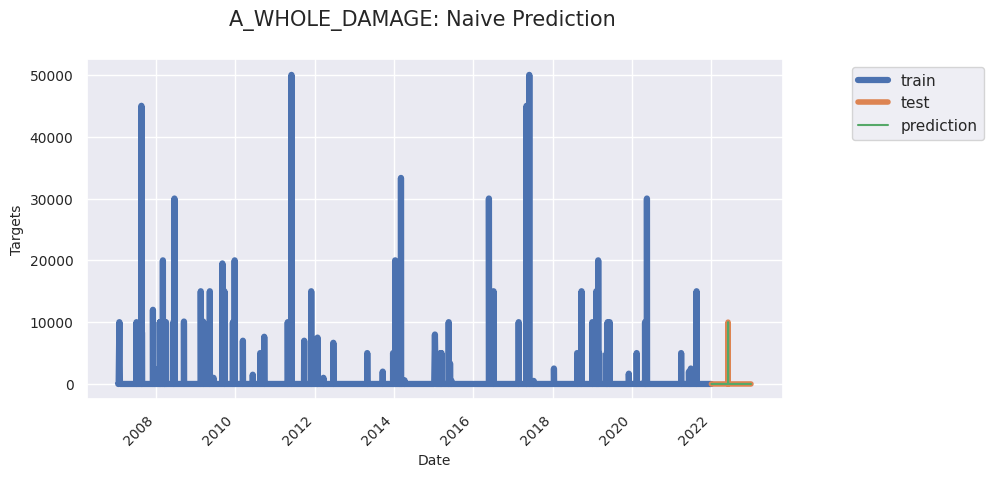

In [68]:
fig, ax = plt.subplots(figsize=(8, 5))
y_train_['A_WHOLE_DAMAGE'].plot(ax=ax, label='train',linewidth=4.5)
y_test_['A_WHOLE_DAMAGE'].plot(ax=ax, label='test',linewidth=4)
y_test_['A_WHOLE_DAMAGE_naive'].plot(ax=ax, label='prediction')
plt.suptitle('A_WHOLE_DAMAGE: Naive Prediction', fontsize=15)
plt.xlabel('Date',fontsize=10)
plt.ylabel('Targets', fontsize=10)
plt.yticks(rotation=0,fontsize=10)
plt.xticks(rotation=45, fontsize=10)
plt.legend(fontsize=10)
ax.legend(bbox_to_anchor=(1.3, 1.0))
plt.show()

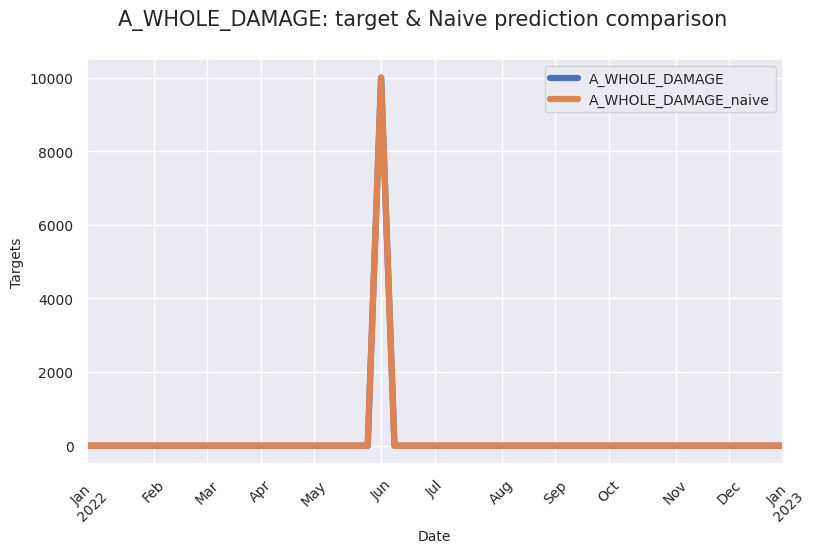

In [69]:
# Plot results
test_df_agg = test_df.groupby(pd.Grouper(freq='W')).agg({
    'A_WHOLE_DAMAGE': 'sum',
    'A_WHOLE_DAMAGE_naive': 'sum'})
plt.rcParams['figure.figsize'] = (8,5)
test_df_agg.plot(linewidth=4.5)
plt.suptitle('A_WHOLE_DAMAGE: target & Naive prediction comparison', fontsize=15)
plt.xlabel('Date',fontsize=10)
plt.ylabel('Targets', fontsize=10)
plt.yticks(rotation=0,fontsize=10)
plt.xticks(rotation=45, fontsize=10)
plt.legend(fontsize=10)
plt.show()

### GLM

#### Fine-tuning

In [70]:
#def objective(trial):
#    params = {
#        'power': trial.suggest_loguniform('power', 1.9, 2),
#        'link':'log'
#    }

#    glm = TweedieRegressor(**params)

#    tscv = TimeSeriesSplit(n_splits=5)
#    mgd_scores = []

#    for train_index, val_index in tscv.split(X_train_sc):
#        X_tr, X_val, tr_weights_sc = X_train_sc.iloc[train_index], X_train_sc.iloc[val_index], train_weights_sc[train_index]
#        y_tr, y_val = y_train.iloc[train_index], y_train.iloc[val_index]

#        glm.fit(X_tr, np.maximum(y_tr,1e-12), sample_weight=tr_weights_sc)
#        pred_val = glm.predict(X_val)

#        mgd_score = mean_gamma_deviance(np.maximum(y_val,1e-12), pred_val)
#        mgd_scores.append(mgd_score)

#    return np.mean(mgd_scores)

#study = optuna.create_study(direction='minimize')
#study.optimize(objective, n_trials=10)

#best_params = study.best_params


In [71]:
#best_params

### Fit & Prediction

In [72]:
glm_tuned = TweedieRegressor(power=2, link='log') # GLM with a Gamma distribution
tscv = TimeSeriesSplit(n_splits=5)
param_grid = {}
glm_model = GridSearchCV(glm_tuned,param_grid,cv=tscv)
glm_model=glm_model.fit(X_train_sc, np.maximum(y_train,1e-12), sample_weight=train_weights_sc)
score_glm = []
predictions_tr = glm_model.predict(X_train_sc)
predictions_te = glm_model.predict(X_test_sc)
rmse_train = np.sqrt(mean_squared_error(y_train, predictions_tr))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions_te))
mae_train = mean_absolute_error(y_train, predictions_tr)
mae_test = mean_absolute_error(y_test, predictions_te)
mgd_train = mean_gamma_deviance(np.maximum(y_train,1e-12), predictions_tr)
mgd_test = mean_gamma_deviance(np.maximum(y_test,1e-12), predictions_te)


score_dict = {
        'rmse_train': rmse_train,
        'rmse_test': rmse_test,
        'mae_train': mae_train,
        'mae_test': mae_test,
        'mgd_train': mgd_train,
        'mgd_test': mgd_test
    }

score_glm.append(score_dict)
score_glm = pd.DataFrame(score_glm, columns = ['rmse_train', 'rmse_test','mae_train','mae_test','mgd_train','mgd_test'])
predictions_tr_glm = pd.DataFrame(predictions_tr, columns = ['A_WHOLE_DAMAGE_predict_glm'])
predictions_te_glm = pd.DataFrame(predictions_te, columns = ['A_WHOLE_DAMAGE_predict_glm'])
train_df = pd.concat([train_df, predictions_tr_glm.set_index(train_df.index)], axis=1)
test_df = pd.concat([test_df, predictions_te_glm.set_index(test_df.index)], axis=1)



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_linear_loss.py:289: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_linear_loss.py:289: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_linear_loss.py:289: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_linear_loss.py:289: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_linear_loss.py:289: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l

### Evaluation

In [73]:
glm_results = {'model':['glm'],
               'rmse_train':score_glm['rmse_train'],
               'rmse_test': score_glm['rmse_test'],
              'mae_train': score_glm['mae_train'],
              'mae_test': score_glm['mae_test'],
              'mgd_train': score_glm['mgd_train'],
              'mgd_test': score_glm['mgd_test']
               }
score_glm = pd.DataFrame(glm_results,
                         columns=['model', 'rmse_train', 'rmse_test','mae_train','mae_test','mgd_train','mgd_test'])
score_glm

,model,rmse_train,rmse_test,mae_train,mae_test,mgd_train,mgd_test
0,glm,3449.108881,3396.097408,3405.117765,3395.294936,69.359196,69.485524


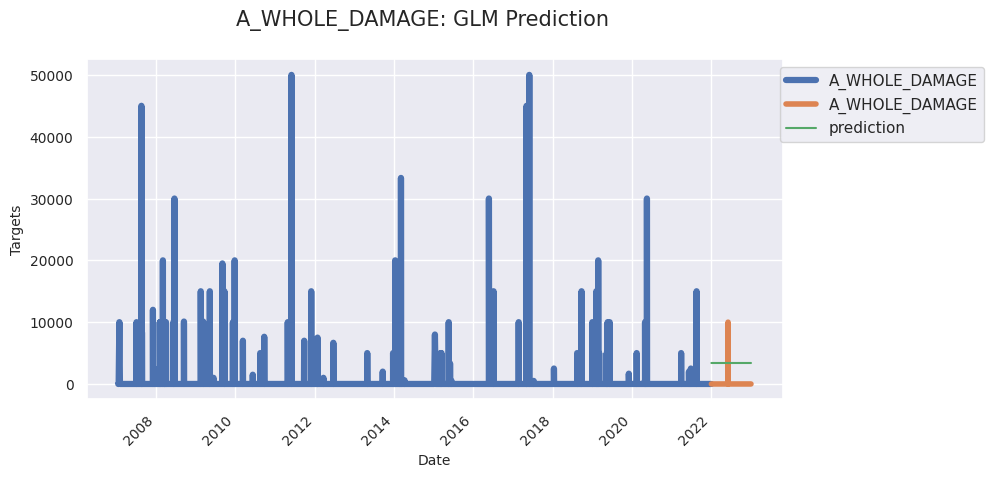

In [74]:
fig, ax = plt.subplots(figsize=(8, 5))
y_train.plot(ax=ax, label='train',linewidth=4.5)
y_test.plot(ax=ax, label='test',linewidth=4)
test_df['A_WHOLE_DAMAGE_predict_glm'].plot(ax=ax, label='prediction')
plt.suptitle('A_WHOLE_DAMAGE: GLM Prediction', fontsize=15)
plt.xlabel('Date',fontsize=10)
plt.ylabel('Targets', fontsize=10)
plt.yticks(rotation=0,fontsize=10)
plt.xticks(rotation=45, fontsize=10)
plt.legend(fontsize=10)
ax.legend(bbox_to_anchor=(1.3, 1.0))
plt.show()

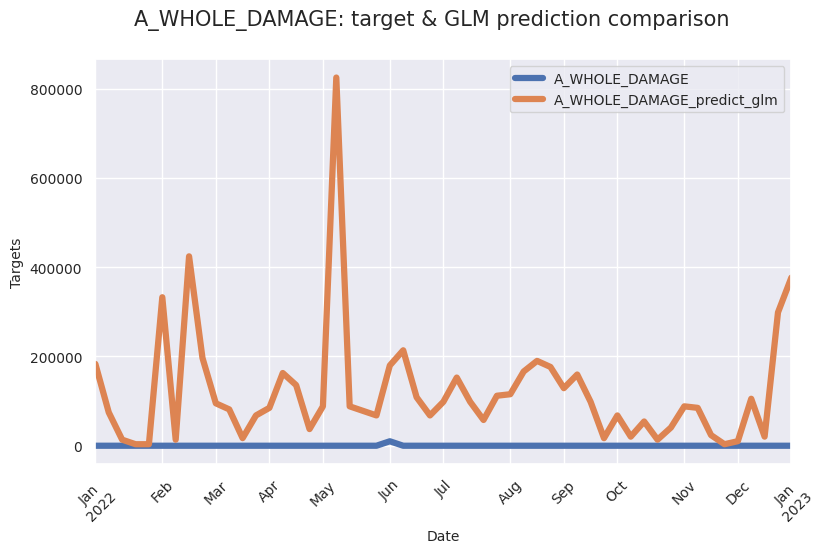

In [75]:
# Plot results
test_df_agg = test_df.groupby(pd.Grouper(freq='W')).agg({
    'A_WHOLE_DAMAGE': 'sum',
    'A_WHOLE_DAMAGE_predict_glm': 'sum'})
plt.rcParams['figure.figsize'] = (8,5)
test_df_agg.plot(linewidth=4.5)
plt.suptitle('A_WHOLE_DAMAGE: target & GLM prediction comparison', fontsize=15)
plt.xlabel('Date',fontsize=10)
plt.ylabel('Targets', fontsize=10)
plt.yticks(rotation=0,fontsize=10)
plt.xticks(rotation=45, fontsize=10)
plt.legend(fontsize=10)
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_linear_loss.py:289: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights


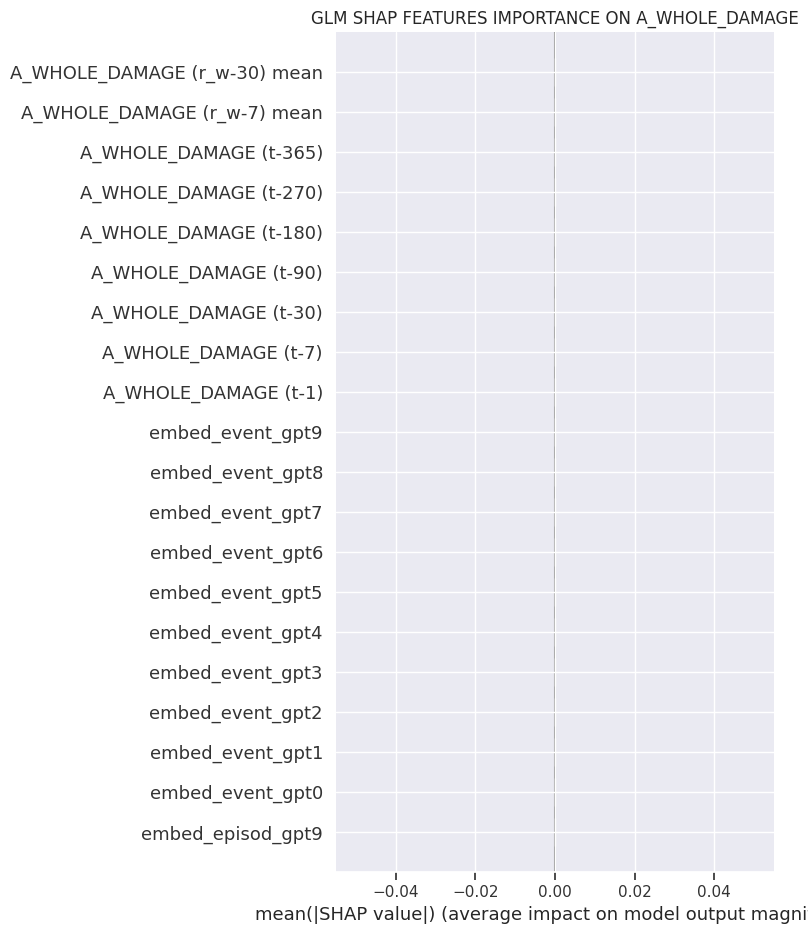

In [76]:
# Global SHAP on GLM
GLM_ = TweedieRegressor(power=2, link='log').fit(X_train_sc, np.maximum(y_train, 1e-12), sample_weight=train_weights_sc)
masker = shap.maskers.Independent(X_train_sc)
GLM_explainer = shap.LinearExplainer(GLM_, masker=masker)
GLM_shap_values = GLM_explainer.shap_values(X_test_sc)
plt.rcParams['figure.figsize'] = (5,5)
plt.title("GLM SHAP FEATURES IMPORTANCE ON A_WHOLE_DAMAGE")
shap.summary_plot(GLM_shap_values, features=X_test_sc, feature_names=X_test_sc.columns,plot_type='bar')




### LightGBM

#### Fine-tuning the model

In [77]:
def objective(trial):
    params = {
        'objective': 'tweedie',
        'random_state': 0,
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
        'max_depth': trial.suggest_int('max_depth', 3, 8),
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100)
    }

    lgbm = LGBMRegressor(**params)

    tscv = TimeSeriesSplit(n_splits=5)
    mgd_scores = []

    for train_index, val_index in tscv.split(X_train):
        X_tr, X_val, tr_weigths = X_train.iloc[train_index], X_train.iloc[val_index], train_weights.iloc[train_index]
        y_tr, y_val = y_train.iloc[train_index], y_train.iloc[val_index]

        lgbm.fit(X_tr, np.maximum(y_tr,1e-12), sample_weight=tr_weigths)
        pred_val = lgbm.predict(X_val)
        pred_val = np.maximum(pred_val,1e-12)

        mgd_score = mean_gamma_deviance(np.maximum(y_val,1e-12), pred_val)
        mgd_scores.append(mgd_score)

    return np.mean(mgd_scores)

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

best_params = study.best_params

[I 2024-05-21 21:26:09,107] A new study created in memory with name: no-name-a84c5ff8-2e6d-42aa-b8b5-2f8cf7d7cc1c


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5811
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 41
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:26:15,505] Trial 0 finished with value: 42.34934318755149 and parameters: {'n_estimators': 977, 'learning_rate': 0.010689076965103093, 'max_depth': 4, 'num_leaves': 110, 'min_child_samples': 66}. Best is trial 0 with value: 42.34934318755149.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:26:17,272] Trial 1 finished with value: 49.993983693154405 and parameters: {'n_estimators': 277, 'learning_rate': 0.01958182705437644, 'max_depth': 3, 'num_leaves': 69, 'min_child_samples': 54}. Best is trial 0 with value: 42.34934318755149.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:26:22,277] Trial 2 finished with value: 36.94638454604385 and parameters: {'n_estimators': 709, 'learning_rate': 0.014197364184460754, 'max_depth': 6, 'num_leaves': 21, 'min_child_samples': 19}. Best is trial 2 with value: 36.94638454604385.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:26:25,686] Trial 3 finished with value: 37.28991475736181 and parameters: {'n_estimators': 487, 'learning_rate': 0.06612195677166509, 'max_depth': 6, 'num_leaves': 107, 'min_child_samples': 89}. Best is trial 2 with value: 36.94638454604385.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5811
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 41
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:26:31,832] Trial 4 finished with value: 35.33209996581437 and parameters: {'n_estimators': 896, 'learning_rate': 0.053976754631300874, 'max_depth': 6, 'num_leaves': 89, 'min_child_samples': 60}. Best is trial 4 with value: 35.33209996581437.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5859
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 47
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:26:35,977] Trial 5 finished with value: 32.72869534121249 and parameters: {'n_estimators': 614, 'learning_rate': 0.03674021402989923, 'max_depth': 6, 'num_leaves': 134, 'min_child_samples': 30}. Best is trial 5 with value: 32.72869534121249.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5811
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 41
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:26:42,292] Trial 6 finished with value: 36.54150702740735 and parameters: {'n_estimators': 836, 'learning_rate': 0.01816805082690542, 'max_depth': 8, 'num_leaves': 91, 'min_child_samples': 84}. Best is trial 5 with value: 32.72869534121249.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:26:44,440] Trial 7 finished with value: 32.870275968880094 and parameters: {'n_estimators': 294, 'learning_rate': 0.06452531655803935, 'max_depth': 5, 'num_leaves': 51, 'min_child_samples': 29}. Best is trial 5 with value: 32.72869534121249.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:26:48,203] Trial 8 finished with value: 35.58252968120362 and parameters: {'n_estimators': 543, 'learning_rate': 0.06045523024525971, 'max_depth': 7, 'num_leaves': 45, 'min_child_samples': 61}. Best is trial 5 with value: 32.72869534121249.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:26:53,622] Trial 9 finished with value: 37.947439331820505 and parameters: {'n_estimators': 917, 'learning_rate': 0.047649054537949195, 'max_depth': 4, 'num_leaves': 144, 'min_child_samples': 97}. Best is trial 5 with value: 32.72869534121249.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:26:54,497] Trial 10 finished with value: 62.54302026510893 and parameters: {'n_estimators': 58, 'learning_rate': 0.03180297764444332, 'max_depth': 8, 'num_leaves': 146, 'min_child_samples': 5}. Best is trial 5 with value: 32.72869534121249.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6033
[LightGBM] [Info] Number of data points in the train set: 29775, number of used features: 48
[LightGBM] [Info] Start training from score 8.189174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2024-05-21 21:26:57,023] Trial 11 finished with value: 32.54137437195553 and parameters: {'n_estimators': 354, 'learning_rate': 0.09050585831622555, 'max_depth': 5, 'num_leaves': 46, 'min_child_samples': 33}. Best is trial 11 with value: 32.54137437195553.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:00,338] Trial 12 finished with value: 32.99259251412739 and parameters: {'n_estimators': 521, 'learning_rate': 0.0845770991562174, 'max_depth': 5, 'num_leaves': 125, 'min_child_samples': 34}. Best is trial 11 with value: 32.54137437195553.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:02,838] Trial 13 finished with value: 36.45542106876657 and parameters: {'n_estimators': 345, 'learning_rate': 0.033008719025510086, 'max_depth': 7, 'num_leaves': 69, 'min_child_samples': 42}. Best is trial 11 with value: 32.54137437195553.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:06,994] Trial 14 finished with value: 28.36433347608091 and parameters: {'n_estimators': 690, 'learning_rate': 0.09737912049714288, 'max_depth': 4, 'num_leaves': 21, 'min_child_samples': 16}. Best is trial 14 with value: 28.36433347608091.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:10,848] Trial 15 finished with value: 715.1413614043724 and parameters: {'n_estimators': 745, 'learning_rate': 0.09979154436009385, 'max_depth': 3, 'num_leaves': 22, 'min_child_samples': 6}. Best is trial 14 with value: 28.36433347608091.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:11,602] Trial 16 finished with value: 39.98761837945628 and parameters: {'n_estimators': 89, 'learning_rate': 0.09995213084448887, 'max_depth': 4, 'num_leaves': 41, 'min_child_samples': 16}. Best is trial 14 with value: 28.36433347608091.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:14,338] Trial 17 finished with value: 34.2295997489251 and parameters: {'n_estimators': 413, 'learning_rate': 0.07583568089228593, 'max_depth': 5, 'num_leaves': 38, 'min_child_samples': 44}. Best is trial 14 with value: 28.36433347608091.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:15,657] Trial 18 finished with value: 39.87732481674448 and parameters: {'n_estimators': 200, 'learning_rate': 0.04698714376158956, 'max_depth': 4, 'num_leaves': 55, 'min_child_samples': 18}. Best is trial 14 with value: 28.36433347608091.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:19,356] Trial 19 finished with value: 40.69307428906832 and parameters: {'n_estimators': 671, 'learning_rate': 0.02264140525796702, 'max_depth': 3, 'num_leaves': 31, 'min_child_samples': 40}. Best is trial 14 with value: 28.36433347608091.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:22,268] Trial 20 finished with value: 33.3524325950665 and parameters: {'n_estimators': 436, 'learning_rate': 0.04099166311125469, 'max_depth': 5, 'num_leaves': 69, 'min_child_samples': 24}. Best is trial 14 with value: 28.36433347608091.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:26,784] Trial 21 finished with value: 30.961129353692108 and parameters: {'n_estimators': 621, 'learning_rate': 0.07391627796885868, 'max_depth': 7, 'num_leaves': 132, 'min_child_samples': 31}. Best is trial 14 with value: 28.36433347608091.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:31,349] Trial 22 finished with value: 28.149388397129723 and parameters: {'n_estimators': 598, 'learning_rate': 0.08241830804006925, 'max_depth': 7, 'num_leaves': 59, 'min_child_samples': 15}. Best is trial 22 with value: 28.149388397129723.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:37,020] Trial 23 finished with value: 25.6296221661176 and parameters: {'n_estimators': 784, 'learning_rate': 0.07437486945264493, 'max_depth': 7, 'num_leaves': 101, 'min_child_samples': 9}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:42,667] Trial 24 finished with value: 27.426822514368997 and parameters: {'n_estimators': 781, 'learning_rate': 0.07781116428565382, 'max_depth': 7, 'num_leaves': 103, 'min_child_samples': 13}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:48,636] Trial 25 finished with value: 447.87122176741286 and parameters: {'n_estimators': 796, 'learning_rate': 0.07693491692734586, 'max_depth': 7, 'num_leaves': 107, 'min_child_samples': 5}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:27:55,022] Trial 26 finished with value: 27.75543204674765 and parameters: {'n_estimators': 823, 'learning_rate': 0.05441280673020661, 'max_depth': 8, 'num_leaves': 98, 'min_child_samples': 11}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:28:01,960] Trial 27 finished with value: 28.312103725308738 and parameters: {'n_estimators': 854, 'learning_rate': 0.026011875244334914, 'max_depth': 8, 'num_leaves': 100, 'min_child_samples': 10}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5867
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 48
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:28:09,737] Trial 28 finished with value: 30.076222501256932 and parameters: {'n_estimators': 976, 'learning_rate': 0.05791069206741185, 'max_depth': 8, 'num_leaves': 118, 'min_child_samples': 24}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:28:14,837] Trial 29 finished with value: 42.98268924458567 and parameters: {'n_estimators': 775, 'learning_rate': 0.010109354694240437, 'max_depth': 8, 'num_leaves': 81, 'min_child_samples': 69}. Best is trial 23 with value: 25.6296221661176.


Output streaming troncato alle ultime 5000 righe.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2024-05-21 21:28:22,239] Trial 30 finished with value: 26.84866833963763 and parameters: {'n_estimators': 997, 'learning_rate': 0.05082734870769961, 'max_depth': 7, 'num_leaves': 100, 'min_child_samples': 11}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5867
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 48
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:28:29,395] Trial 31 finished with value: 27.96487445935487 and parameters: {'n_estimators': 991, 'learning_rate': 0.04971502371430663, 'max_depth': 7, 'num_leaves': 98, 'min_child_samples': 11}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5867
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 48
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:28:36,194] Trial 32 finished with value: 30.29406449406391 and parameters: {'n_estimators': 922, 'learning_rate': 0.06783745910841064, 'max_depth': 7, 'num_leaves': 117, 'min_child_samples': 23}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:28:42,798] Trial 33 finished with value: 27.835116798972912 and parameters: {'n_estimators': 846, 'learning_rate': 0.04109240809298313, 'max_depth': 8, 'num_leaves': 84, 'min_child_samples': 11}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5867
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 48
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:28:48,135] Trial 34 finished with value: 31.747303580420642 and parameters: {'n_estimators': 738, 'learning_rate': 0.05262232962322594, 'max_depth': 6, 'num_leaves': 100, 'min_child_samples': 22}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:28:55,142] Trial 35 finished with value: 26.254686264115925 and parameters: {'n_estimators': 947, 'learning_rate': 0.06937828474397441, 'max_depth': 7, 'num_leaves': 79, 'min_child_samples': 11}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:29:02,070] Trial 36 finished with value: 33.38741260442606 and parameters: {'n_estimators': 962, 'learning_rate': 0.06923913303405917, 'max_depth': 6, 'num_leaves': 76, 'min_child_samples': 51}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5867
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 48
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:29:08,567] Trial 37 finished with value: 34.76925230735066 and parameters: {'n_estimators': 886, 'learning_rate': 0.012972577510740312, 'max_depth': 7, 'num_leaves': 112, 'min_child_samples': 27}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5811
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 41
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:29:15,122] Trial 38 finished with value: 35.38486334590031 and parameters: {'n_estimators': 936, 'learning_rate': 0.04194933844167855, 'max_depth': 6, 'num_leaves': 90, 'min_child_samples': 77}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:29:21,481] Trial 39 finished with value: 31.471814806116736 and parameters: {'n_estimators': 876, 'learning_rate': 0.062130623005120705, 'max_depth': 6, 'num_leaves': 76, 'min_child_samples': 36}. Best is trial 23 with value: 25.6296221661176.


Output streaming troncato alle ultime 5000 righe.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

[I 2024-05-21 21:29:28,680] Trial 40 finished with value: 28.838483133020297 and parameters: {'n_estimators': 995, 'learning_rate': 0.0867746829368677, 'max_depth': 7, 'num_leaves': 109, 'min_child_samples': 19}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5867
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 48
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:29:35,243] Trial 41 finished with value: 27.486288652601722 and parameters: {'n_estimators': 817, 'learning_rate': 0.05573323779514673, 'max_depth': 8, 'num_leaves': 94, 'min_child_samples': 13}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5867
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 48
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:29:41,144] Trial 42 finished with value: 28.049700750476553 and parameters: {'n_estimators': 791, 'learning_rate': 0.06256954611597036, 'max_depth': 7, 'num_leaves': 93, 'min_child_samples': 13}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:29:48,748] Trial 43 finished with value: 25.996456360570583 and parameters: {'n_estimators': 919, 'learning_rate': 0.0734331912918922, 'max_depth': 8, 'num_leaves': 86, 'min_child_samples': 8}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5867
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 48
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2024-05-21 21:29:56,342] Trial 44 finished with value: 4162.954857379989 and parameters: {'n_estimators': 936, 'learning_rate': 0.07145239557965202, 'max_depth': 8, 'num_leaves': 64, 'min_child_samples': 8}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:30:02,793] Trial 45 finished with value: 28.60135199874764 and parameters: {'n_estimators': 887, 'learning_rate': 0.08038820036820464, 'max_depth': 6, 'num_leaves': 80, 'min_child_samples': 20}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:30:09,896] Trial 46 finished with value: 712.8221451351154 and parameters: {'n_estimators': 937, 'learning_rate': 0.0902605417258485, 'max_depth': 7, 'num_leaves': 105, 'min_child_samples': 5}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:30:15,672] Trial 47 finished with value: 30.75827607772619 and parameters: {'n_estimators': 766, 'learning_rate': 0.06638625911729622, 'max_depth': 7, 'num_leaves': 85, 'min_child_samples': 26}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-05-21 21:30:21,270] Trial 48 finished with value: 29.47375427343502 and parameters: {'n_estimators': 711, 'learning_rate': 0.04555954142216302, 'max_depth': 8, 'num_leaves': 115, 'min_child_samples': 17}. Best is trial 23 with value: 25.6296221661176.


Output streaming troncato alle ultime 5000 righe.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5867
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 48
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2024-05-21 21:30:28,998] Trial 49 finished with value: 1413.1280070697712 and parameters: {'n_estimators': 1000, 'learning_rate': 0.05822887160924373, 'max_depth': 7, 'num_leaves': 122, 'min_child_samples': 8}. Best is trial 23 with value: 25.6296221661176.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [78]:
best_params

{'n_estimators': 784,
 'learning_rate': 0.07437486945264493,
 'max_depth': 7,
 'num_leaves': 101,
 'min_child_samples': 9}

#### Fit & Prediction

In [79]:
lgbm_tuned =  LGBMRegressor(
    n_estimators= 445,
    learning_rate= 0.09274864552097149,
    max_depth= 5,
    num_leaves= 43,
    min_child_samples= 9,
    objective='tweedie',
    random_state=0)
tscv = TimeSeriesSplit(n_splits=5)
param_grid = {}
lgbm_model = GridSearchCV(lgbm_tuned,param_grid,cv=tscv)
lgbm_model.fit(X_train, np.maximum(y_train,1e-12), sample_weight=train_weights)
score_lgbm=[]
predictions_tr = np.maximum(lgbm_model.predict(X_train),1e-12)
predictions_te = np.maximum(lgbm_model.predict(X_test),1e-12)
rmse_train = np.sqrt(mean_squared_error(y_train, predictions_tr))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions_te))
mae_train = mean_absolute_error(y_train, predictions_tr)
mae_test = mean_absolute_error(y_test, predictions_te)
mgd_train = mean_gamma_deviance(np.maximum(y_train,1e-12), predictions_tr)
mgd_test = mean_gamma_deviance(np.maximum(y_test,1e-12), predictions_te)


score_dict = {
        'rmse_train': rmse_train,
        'rmse_test': rmse_test,
        'mae_train': mae_train,
        'mae_test': mae_test,
        'mgd_train': mgd_train,
        'mgd_test': mgd_test
    }

score_lgbm.append(score_dict)
score_lgbm = pd.DataFrame(score_lgbm, columns = ['rmse_train', 'rmse_test','mae_train','mae_test','mgd_train','mgd_test'])
predictions_tr_lgbm = pd.DataFrame(predictions_tr, columns = ['A_WHOLE_DAMAGE_predict_lgbm'])
predictions_te_lgbm = pd.DataFrame(predictions_te, columns = ['A_WHOLE_DAMAGE_predict_lgbm'])
train_df = pd.concat([train_df, predictions_tr_lgbm.set_index(train_df.index)], axis=1)
test_df = pd.concat([test_df, predictions_te_lgbm.set_index(test_df.index)], axis=1)



[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5867
[LightGBM] [Info] Number of data points in the train set: 5955, number of used features: 48
[LightGBM] [Info] Start training from score 8.585190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

### Evaluation

In [80]:
lgbm_results = {'model':['lgbm'],
               'rmse_train':score_lgbm['rmse_train'],
               'rmse_test': score_lgbm['rmse_test'],
              'mae_train': score_lgbm['mae_train'],
              'mae_test': score_lgbm['mae_test'],
              'mgd_train':score_lgbm['mgd_train'],
              'mgd_test':score_lgbm['mgd_test']
               }
score_lgbm = pd.DataFrame(lgbm_results,
                         columns=['model', 'rmse_train', 'rmse_test','mae_train','mae_test','mgd_train','mgd_test'])
score_lgbm

,model,rmse_train,rmse_test,mae_train,mae_test,mgd_train,mgd_test
0,lgbm,918.571947,187.265672,58.5839,7.005933,21.403615,21.563657


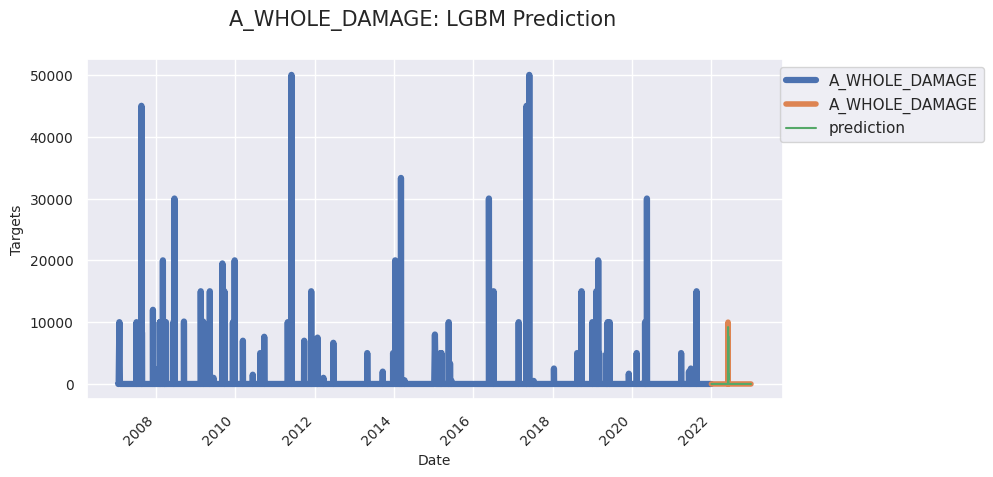

In [81]:
fig, ax = plt.subplots(figsize=(8, 5))
y_train.plot(ax=ax, label='train',linewidth=4.5)
y_test.plot(ax=ax, label='test',linewidth=4)
test_df['A_WHOLE_DAMAGE_predict_lgbm'].plot(ax=ax, label='prediction')
plt.suptitle('A_WHOLE_DAMAGE: LGBM Prediction', fontsize=15)
plt.xlabel('Date',fontsize=10)
plt.ylabel('Targets', fontsize=10)
plt.yticks(rotation=0,fontsize=10)
plt.xticks(rotation=45, fontsize=10)
plt.legend(fontsize=10)
ax.legend(bbox_to_anchor=(1.3, 1.0))
plt.show()

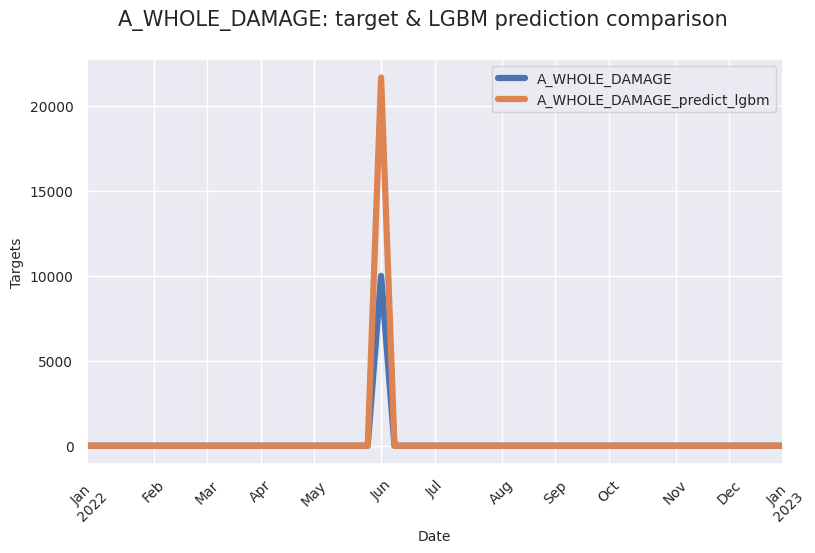

In [82]:
# Plot results
test_df_agg = test_df.groupby(pd.Grouper(freq='W')).agg({
    'A_WHOLE_DAMAGE': 'sum',
    'A_WHOLE_DAMAGE_predict_lgbm': 'sum'})
plt.rcParams['figure.figsize'] = (8,5)
test_df_agg.plot(linewidth=4.5)
plt.suptitle('A_WHOLE_DAMAGE: target & LGBM prediction comparison', fontsize=15)
plt.xlabel('Date',fontsize=10)
plt.ylabel('Targets', fontsize=10)
plt.yticks(rotation=0,fontsize=10)
plt.xticks(rotation=45, fontsize=10)
plt.legend(fontsize=10)
plt.show()

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6051
[LightGBM] [Info] Number of data points in the train set: 35730, number of used features: 48
[LightGBM] [Info] Start training from score 8.129646
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

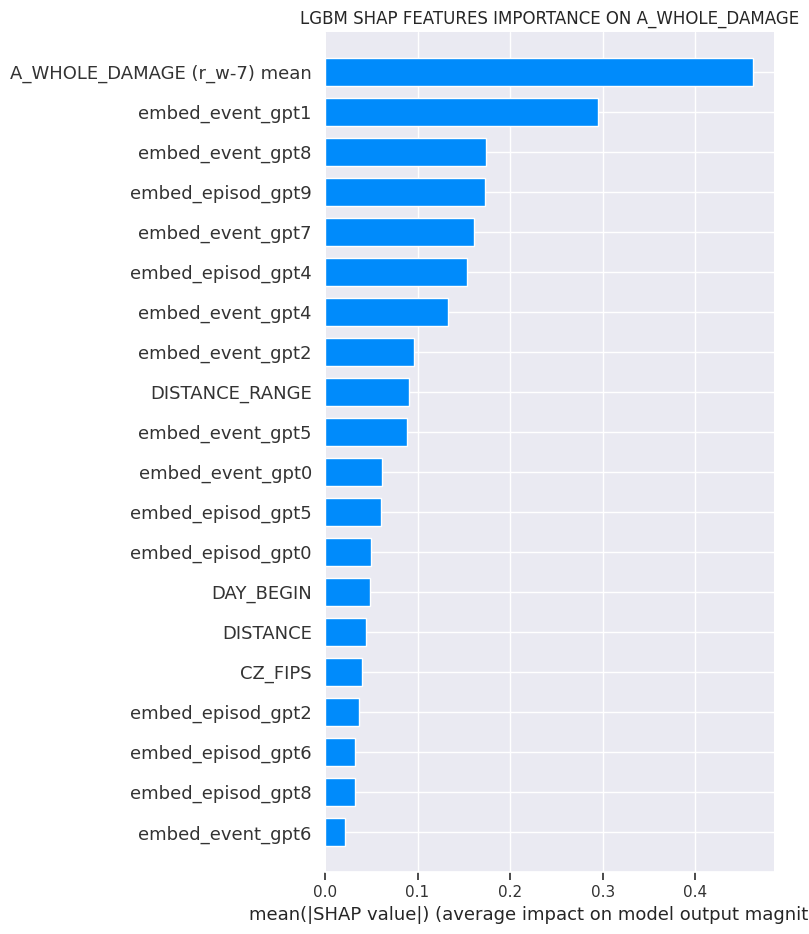

In [83]:
# Global SHAP on LGBM
LGBM_ = LGBMRegressor(
    n_estimators= 445,
    learning_rate= 0.09274864552097149,
    max_depth= 5,
    num_leaves= 43,
    min_child_samples= 9,
    objective='tweedie',
    random_state=0).fit(X_train, y_train, sample_weight=train_weights)
LGBM_explainer = shap.TreeExplainer(LGBM_)
LGBM_shap_values = LGBM_explainer.shap_values(X_test)
plt.rcParams['figure.figsize'] = (5,5)
plt.title("LGBM SHAP FEATURES IMPORTANCE ON A_WHOLE_DAMAGE")
shap.summary_plot(LGBM_shap_values, features=X_test, feature_names=X_test.columns,plot_type='bar')

### NN

#### Fine-tuning the model

In [84]:
# fine-tuning
#def objective(trial):
#    params = {
#        'hidden_layer_sizes': (trial.suggest_int('n_neurons_1', 10, 500), trial.suggest_int('n_neurons_2', 10, 500), trial.suggest_int('n_neurons_3', 10, 500)),
#        'alpha': trial.suggest_loguniform('alpha', 1e-5, 1e2),
#        'learning_rate_init': trial.suggest_loguniform('learning_rate_init', 1e-4, 1e-2),
#        'max_iter': trial.suggest_int('max_iter', 10, 100),
#        'random_state': 0,
#        'activation':'relu'
#    }

#    mlp = MLPRegressor(**params)

#    tscv = TimeSeriesSplit(n_splits=5)
#    mgd_scores = []

#    X_train_sc_ = pd.concat([X_train_sc, train_weights_sc], axis=1)

#    for train_index, val_index in tscv.split(X_train_sc_):
#        X_tr, X_val = X_train_sc_.iloc[train_index], X_train_sc_.iloc[val_index]
#        y_tr, y_val = y_train.iloc[train_index], y_train.iloc[val_index]

#        mlp.fit(X_tr, np.maximum(y_tr, 1e-12))
#        pred_val = mlp.predict(X_val)
#        pred_val = np.maximum(pred_val, 1e-12) # Ensure predictions are strictly positive

#        mgd_score = mean_squared_error(np.maximum(y_val,1e-12), pred_val)
#        mgd_scores.append(mgd_score)

#    return np.mean(mgd_scores)

#study = optuna.create_study(direction='minimize')
#study.optimize(objective, n_trials=10)

#best_params = study.best_params

In [85]:
#best_params

#### Fit & Prediction

In [86]:
X_train_sc_ = pd.concat([X_train_sc, train_weights_sc], axis=1)
X_test_sc_ = pd.concat([X_test_sc, test_weights_sc], axis=1)


nn_tuned =  MLPRegressor(
hidden_layer_sizes= (179,137,16),
activation= 'relu',
alpha= 3.2512025099429147,
learning_rate_init=0.00023670207860486373,
max_iter=71,
random_state=0)
tscv = TimeSeriesSplit(n_splits=5)
param_grid = {}
nn_model = GridSearchCV(nn_tuned,param_grid,cv=tscv)
nn_model.fit(X_train_sc_, np.maximum(y_train,1e-12))
score_nn=[]
predictions_tr = np.maximum(nn_model.predict(X_train_sc_),1e-12)
predictions_te = np.maximum(nn_model.predict(X_test_sc_),1e-12)
rmse_train = np.sqrt(mean_squared_error(y_train, predictions_tr))
rmse_test = np.sqrt(mean_squared_error(y_test, predictions_te))
mae_train = mean_absolute_error(y_train, predictions_tr)
mae_test = mean_absolute_error(y_test, predictions_te)
mgd_train = mean_gamma_deviance(np.maximum(y_train,1e-12), predictions_tr)
mgd_test = mean_gamma_deviance(np.maximum(y_test,1e-12), predictions_te)


score_dict = {
        'rmse_train': rmse_train,
        'rmse_test': rmse_test,
        'mae_train': mae_train,
        'mae_test': mae_test,
        'mgd_train': mgd_train,
        'mgd_test': mgd_test
    }

score_nn.append(score_dict)
score_nn = pd.DataFrame(score_nn, columns = ['rmse_train', 'rmse_test','mae_train','mae_test','mgd_train','mgd_test'])
predictions_tr_nn = pd.DataFrame(predictions_tr, columns = ['A_WHOLE_DAMAGE_predict_nn'])
predictions_te_nn = pd.DataFrame(predictions_te, columns = ['A_WHOLE_DAMAGE_predict_nn'])
train_df = pd.concat([train_df, predictions_tr_nn.set_index(train_df.index)], axis=1)
test_df = pd.concat([test_df, predictions_te_nn.set_index(test_df.index)], axis=1)


### Evaluation

In [87]:
nn_results = {'model':['nn'],
              'rmse_train':score_nn['rmse_train'],
              'rmse_test': score_nn['rmse_test'],
              'mae_train': score_nn['mae_train'],
              'mae_test': score_nn['mae_test'],
              'mgd_train':score_nn['mgd_train'],
              'mgd_test':score_nn['mgd_test']
}
score_nn = pd.DataFrame(nn_results,
                         columns=['model', 'rmse_train', 'rmse_test','mae_train','mae_test','mgd_train','mgd_test'])
score_nn

,model,rmse_train,rmse_test,mae_train,mae_test,mgd_train,mgd_test
0,nn,677.568999,209.380606,43.775676,8.975213,3.294475,3.170548


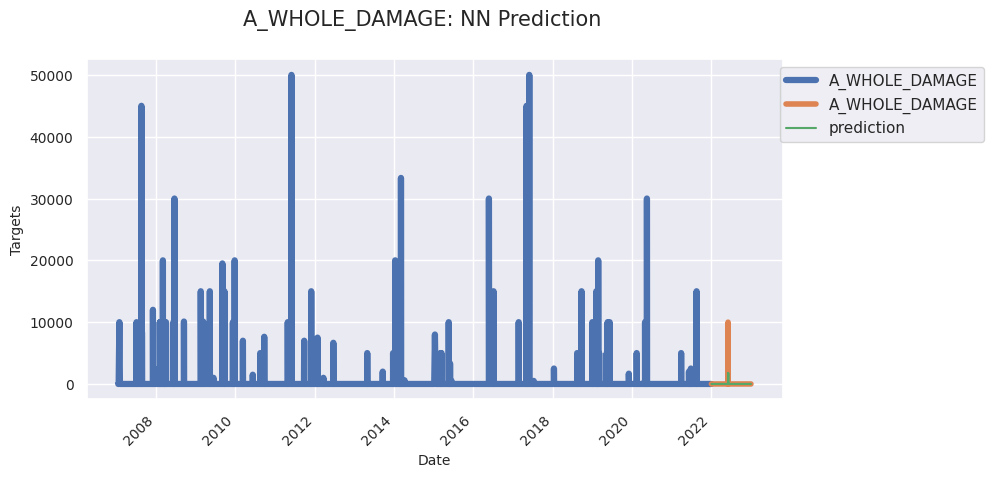

In [88]:
fig, ax = plt.subplots(figsize=(8, 5))
y_train.plot(ax=ax, label='train',linewidth=4.5)
y_test.plot(ax=ax, label='test',linewidth=4)
test_df['A_WHOLE_DAMAGE_predict_nn'].plot(ax=ax, label='prediction')
plt.suptitle('A_WHOLE_DAMAGE: NN Prediction', fontsize=15)
plt.xlabel('Date',fontsize=10)
plt.ylabel('Targets', fontsize=10)
plt.yticks(rotation=0,fontsize=10)
plt.xticks(rotation=45, fontsize=10)
plt.legend(fontsize=10)
ax.legend(bbox_to_anchor=(1.3, 1.0))
plt.show()

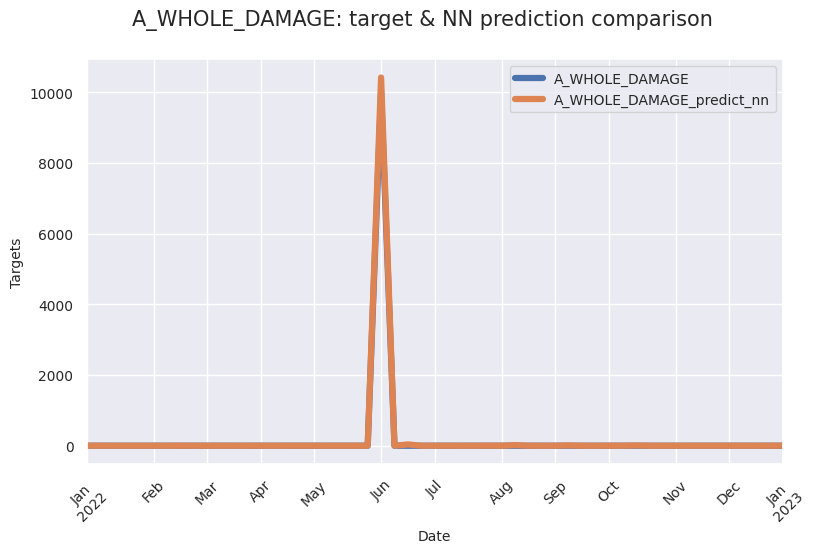

In [89]:
test_df_agg = test_df.groupby(pd.Grouper(freq='W')).agg({
    'A_WHOLE_DAMAGE': 'sum',
    'A_WHOLE_DAMAGE_predict_nn': 'sum'})
plt.rcParams['figure.figsize'] = (8,5)
test_df_agg.plot(linewidth=4.5)
plt.suptitle('A_WHOLE_DAMAGE: target & NN prediction comparison', fontsize=15)
plt.xlabel('Date',fontsize=10)
plt.ylabel('Targets', fontsize=10)
plt.yticks(rotation=0,fontsize=10)
plt.xticks(rotation=45, fontsize=10)
plt.legend(fontsize=10)
plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

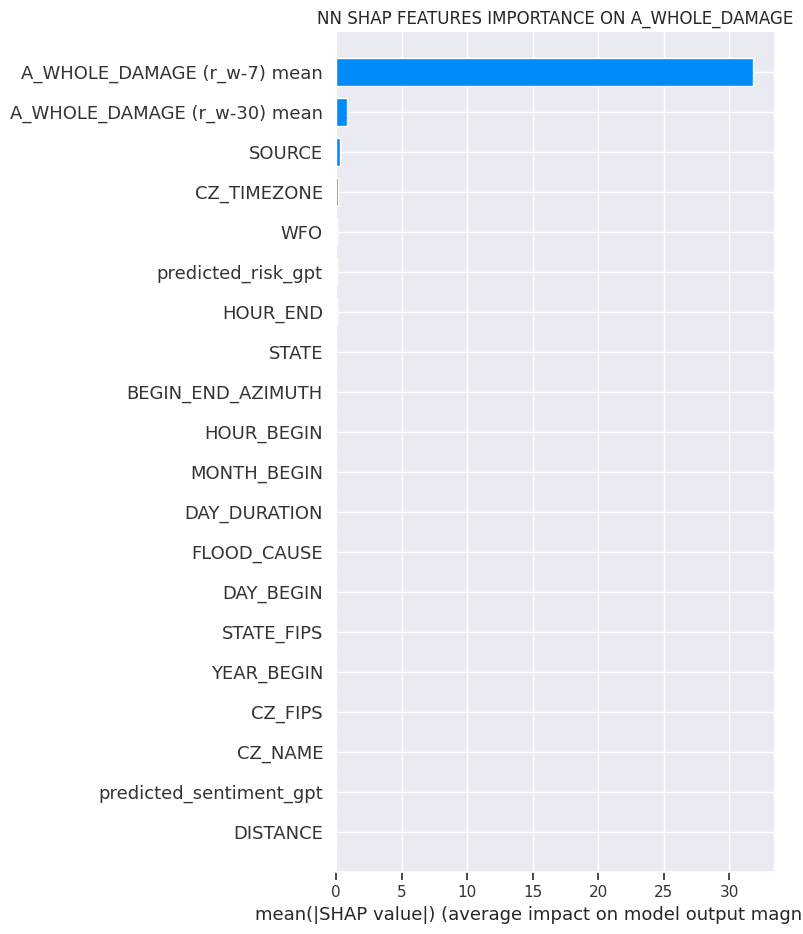

In [90]:
# Global SHAP on NN
NN_ = MLPRegressor(
hidden_layer_sizes= (179,137,16),
activation= 'relu',
alpha= 3.2512025099429147,
learning_rate_init=0.00023670207860486373,
max_iter=71,
random_state=0).fit(X_train_sc_, y_train)

# Choose 100 random samples from train and test
train_sample_indices = np.random.choice(len(X_train_sc_), 100, replace=False)
test_sample_indices = np.random.choice(len(X_test_sc_), 100, replace=False)

NN_explainer = shap.KernelExplainer(NN_.predict, X_train_sc_.iloc[train_sample_indices])
NN_shap_values = NN_explainer.shap_values(X_test_sc_.iloc[test_sample_indices])
plt.rcParams['figure.figsize'] = (5,5)
plt.title("NN SHAP FEATURES IMPORTANCE ON A_WHOLE_DAMAGE")
shap.summary_plot(NN_shap_values, features=X_test_sc_.iloc[test_sample_indices], feature_names=X_test_sc_.columns, plot_type='bar')

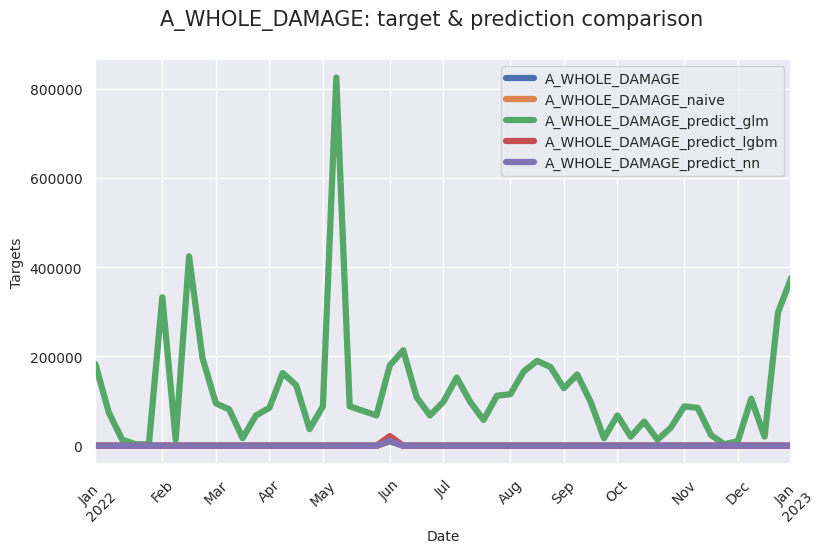

In [91]:
# plot all models
test_df_agg = test_df.groupby(pd.Grouper(freq='W')).agg({
    'A_WHOLE_DAMAGE': 'sum',
    'A_WHOLE_DAMAGE_naive': 'sum',
    'A_WHOLE_DAMAGE_predict_glm': 'sum',
    'A_WHOLE_DAMAGE_predict_lgbm': 'sum',
    'A_WHOLE_DAMAGE_predict_nn': 'sum'
    })
plt.rcParams['figure.figsize'] = (8,5)
test_df_agg.plot(linewidth=4.5)
plt.suptitle('A_WHOLE_DAMAGE: target & prediction comparison', fontsize=15)
plt.xlabel('Date',fontsize=10)
plt.ylabel('Targets', fontsize=10)
plt.yticks(rotation=0,fontsize=10)
plt.xticks(rotation=45, fontsize=10)
plt.legend(fontsize=10)
plt.show()

In [92]:
# total score
score = pd.concat([score_naive, score_glm, score_lgbm, score_nn])
score

,model,rmse_train,rmse_test,mae_train,mae_test,mgd_train,mgd_test
0,naive,1056.433146,325.128044,52.480618,10.570825,N/A,N/A
0,glm,3449.108881,3396.097408,3405.117765,3395.294936,69.359196,69.485524
0,lgbm,918.571947,187.265672,58.583900,7.005933,21.403615,21.563657
0,nn,677.568999,209.380606,43.775676,8.975213,3.294475,3.170548


#### Plot score results

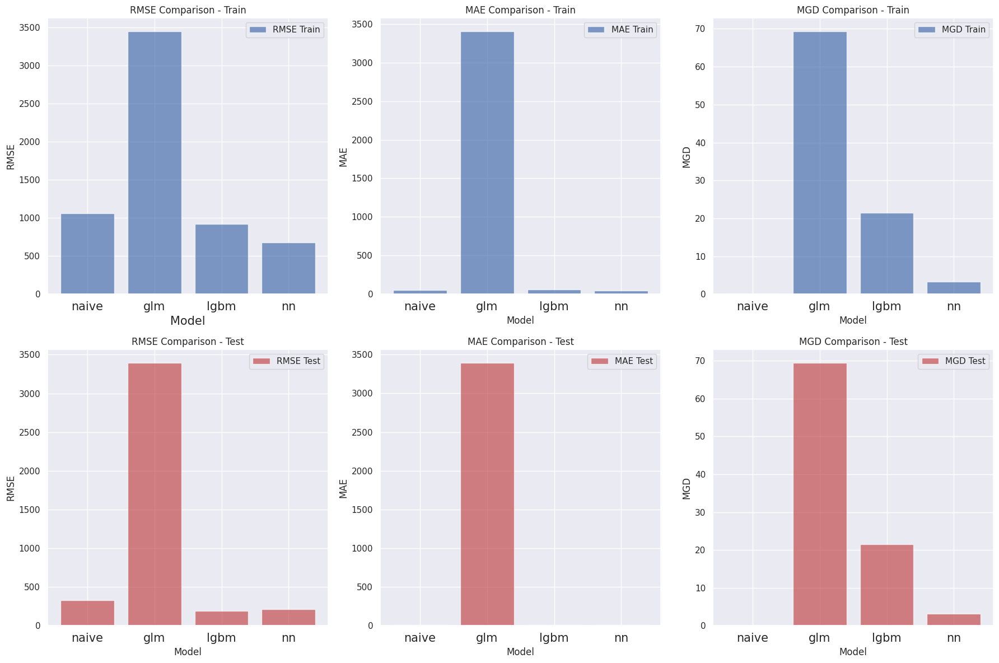

In [93]:
# Reset the index of the DataFrame
score = score.reset_index(drop=True)

# Replace 'N/A' with 0 only for the 'naive' row
score.loc[score['model'] == 'naive', ['mgd_train', 'mgd_test']] = score.loc[score['model'] == 'naive', ['mgd_train', 'mgd_test']].replace('N/A', 0)

# Convert 'mpd_train' and 'mpd_test' to float type
score['mgd_train'] = score['mgd_train'].astype(float)
score['mgd_test'] = score['mgd_test'].astype(float)

# Plotting 6 charts with 3 per row
plt.figure(figsize=(18, 12))

# Plot RMSE comparison for Train and Test
plt.subplot(2, 3, 1)
plt.bar(score['model'], score['rmse_train'], color='b', alpha=0.7, label='RMSE Train')
plt.xlabel('Model',fontsize=15)
plt.ylabel('RMSE')
plt.xticks(fontsize=15)
plt.legend()
plt.title('RMSE Comparison - Train')

plt.subplot(2, 3, 4)
plt.bar(score['model'], score['rmse_test'], color='r', alpha=0.7, label='RMSE Test')
plt.xlabel('Model')
plt.ylabel('RMSE')
plt.xticks(fontsize=15)
plt.legend()
plt.title('RMSE Comparison - Test')

# Plot MAE comparison for Train and Test
plt.subplot(2, 3, 2)
plt.bar(score['model'], score['mae_train'], color='b', alpha=0.7, label='MAE Train')
plt.xlabel('Model')
plt.xticks(fontsize=15)
plt.ylabel('MAE')
plt.legend()
plt.title('MAE Comparison - Train')

plt.subplot(2, 3, 5)
plt.bar(score['model'], score['mae_test'], color='r', alpha=0.7, label='MAE Test')
plt.xlabel('Model')
plt.ylabel('MAE')
plt.xticks(fontsize=15)
plt.legend()
plt.title('MAE Comparison - Test')

# Plot MGD comparison for Train and Test
plt.subplot(2, 3, 3)
plt.bar(score['model'], score['mgd_train'], color='b', alpha=0.7, label='MGD Train')
plt.xlabel('Model')
plt.ylabel('MGD')
plt.xticks(fontsize=15)
plt.legend()
plt.title('MGD Comparison - Train')

plt.subplot(2, 3, 6)
plt.bar(score['model'], score['mgd_test'], color='r', alpha=0.7, label='MGD Test')
plt.xlabel('Model')
plt.ylabel('MGD')
plt.xticks(fontsize=15)
plt.legend()
plt.title('MGD Comparison - Test')

plt.tight_layout()
plt.show()